In [4]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

## Image blending

In [2]:
img1 = cv2.imread('../../opencv_udemy/DATA/dog_backpack.png')
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2 = cv2.imread('../../opencv_udemy/DATA/watermark_no_copy.png')
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

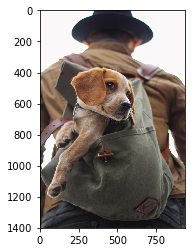

In [5]:
plt.imshow(img1)

In [7]:
img1.shape

(1401, 934, 3)

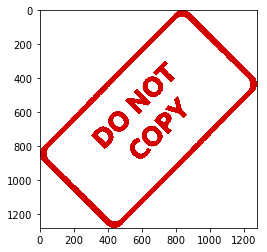

In [8]:
plt.imshow(img2)

In [9]:
img2.shape

(1280, 1277, 3)

### Blending images of the same size

In [11]:
#Resize both images
img1 = cv2.resize(img1, (1200, 1200))
img2 = cv2.resize(img2, (1200, 1200))

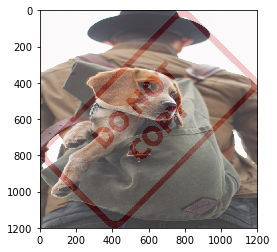

In [17]:
img3 = cv2.addWeighted(img1, 0.8, img2, 0.2, 0)
plt.imshow(img3)

### Overlay small image on top of a larger image (no blending)

In [19]:
img1 = cv2.imread('../../opencv_udemy/DATA/dog_backpack.png')
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2 = cv2.imread('../../opencv_udemy/DATA/watermark_no_copy.png')
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

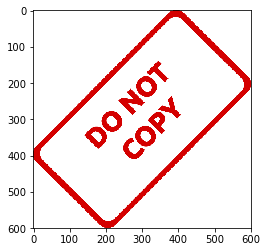

In [20]:
#First resize img2 to be smaller so it can fit in img1
img2 = cv2.resize(img2, (600, 600))
plt.imshow(img2)

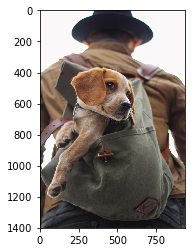

In [21]:
plt.imshow(img1)

In [22]:
large_img = img1
small_img = img2

In [24]:
x_offset = 150
y_offset = 400
x_end = x_offset + small_img.shape[1]
y_end = y_offset + small_img.shape[0]

In [25]:
large_img[y_offset:y_end, x_offset:x_end] = small_img

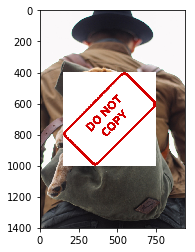

In [26]:
plt.imshow(large_img)

### Blend together images of different sizes

In [2]:
img1 = cv2.imread('../../opencv_udemy/DATA/dog_backpack.png')
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2 = cv2.imread('../../opencv_udemy/DATA/watermark_no_copy.png')
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

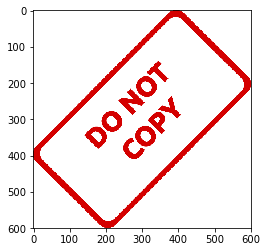

In [3]:
#First resize img2 to be smaller so it can fit in img1
img2 = cv2.resize(img2, (600, 600))
plt.imshow(img2)

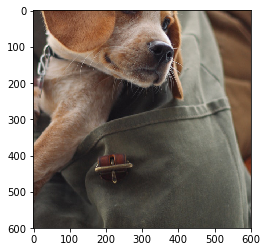

In [4]:
#Taking a region of interest from img1
x_offset = 200
y_offset = 500
x_end = x_offset + 600
y_end = y_offset + 600

roi = img1[y_offset:y_end, x_offset:x_end]

plt.imshow(roi)

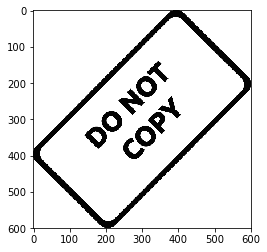

In [6]:
#Creating a mask from img2

img2gray = cv2.cvtColor(img2, cv2.COLOR_RGB2GRAY)
plt.imshow(img2gray, cmap = 'gray')

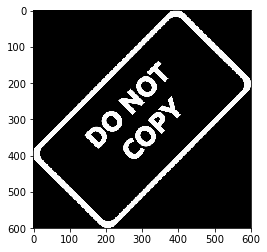

In [7]:
mask_inv = cv2.bitwise_not(img2gray)
plt.imshow(mask_inv, cmap = 'gray')

In [11]:
#mask_inv has only one color channel
mask_inv.shape

(600, 600)

In [17]:
#Add the remaining color channels

#create a white background in 3 channels of size img2
white_background = np.full(img2.shape, 255, dtype=np.uint8)

#this function creates the mask with 3 color channels
bk = cv2.bitwise_or(white_background, white_background, mask=mask_inv)
bk.shape

(600, 600, 3)

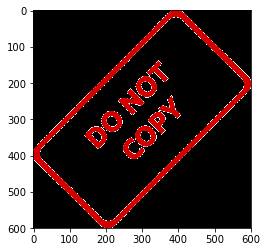

In [19]:
#Create a new img2 with original colors but with the mask applied to it

fg = cv2.bitwise_or(img2, img2, mask=mask_inv)
plt.imshow(fg)

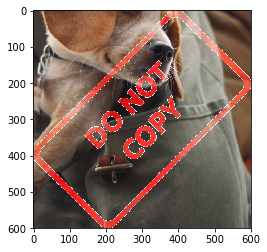

In [23]:
#blending roi with new img2

final_roi = cv2.bitwise_or(roi, fg)
plt.imshow(final_roi)

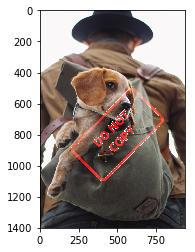

In [25]:
#creating final image with new roi replaced.
new_img = img1

new_img[y_offset:y_end, x_offset:x_end] = final_roi
plt.imshow(new_img)

In [5]:
def load_img():
    img = cv2.imread('../../opencv_udemy/DATA/bricks.jpg').astype(np.float32) / 255
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img

In [6]:
def display_img(img):
    fig = plt.figure(figsize=(12, 10))
    ax = fig.add_subplot(111)
    ax.imshow(img)

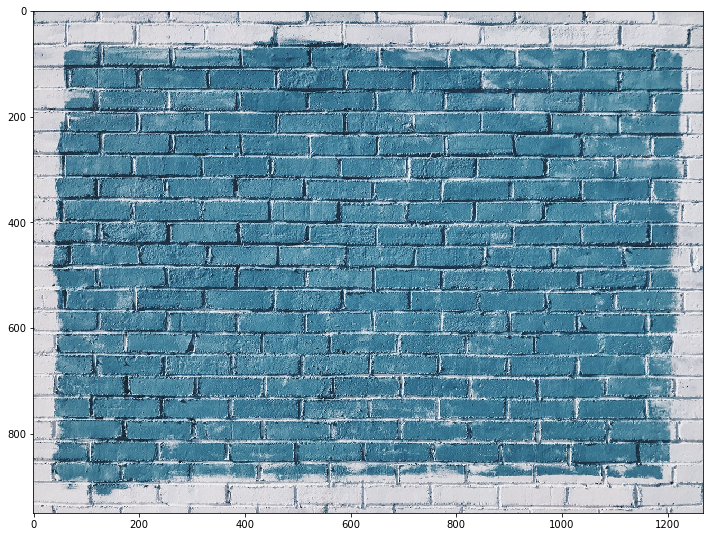

In [7]:
img = load_img()
display_img(img)

## Gamma correction

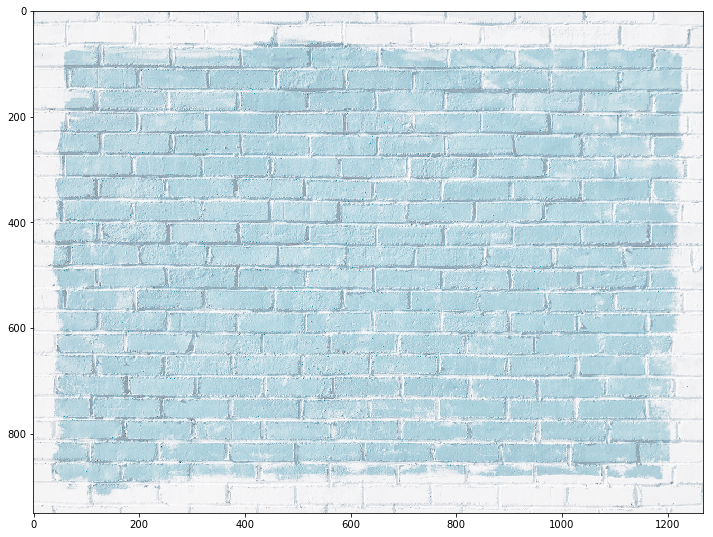

In [9]:
#Set the desired gamma value, this value will make it look brighter
gama = 1/4
img_gama = np.power(img, gama)
display_img(img_gama)

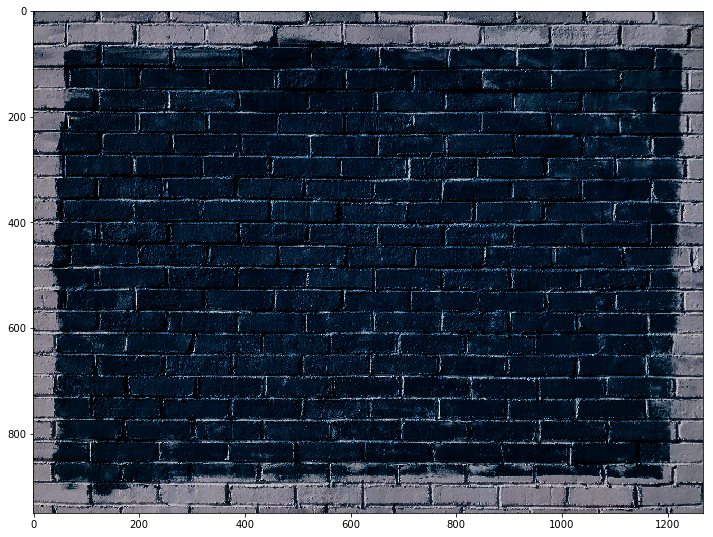

In [11]:
#Set the desired gamma value, this value will make it look darker
gama = 4
img_gama = np.power(img, gama)
display_img(img_gama)

## Image blurring

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


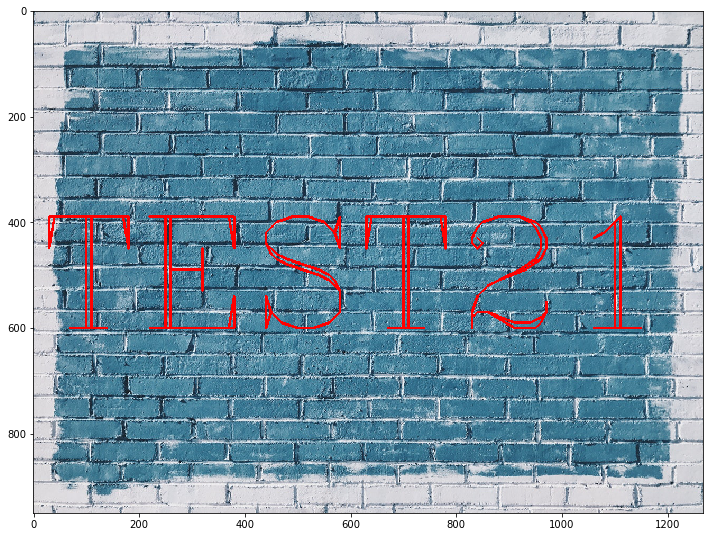

In [29]:
img = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img, text='TEST21', org=(10, 600), fontFace=font, fontScale=10, color=(255, 0, 0), thickness=4)
display_img(img)

In [41]:
kernel = np.ones(shape=(5, 5), dtype=np.float32) / 25
kernel

array([[0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04]], dtype=float32)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


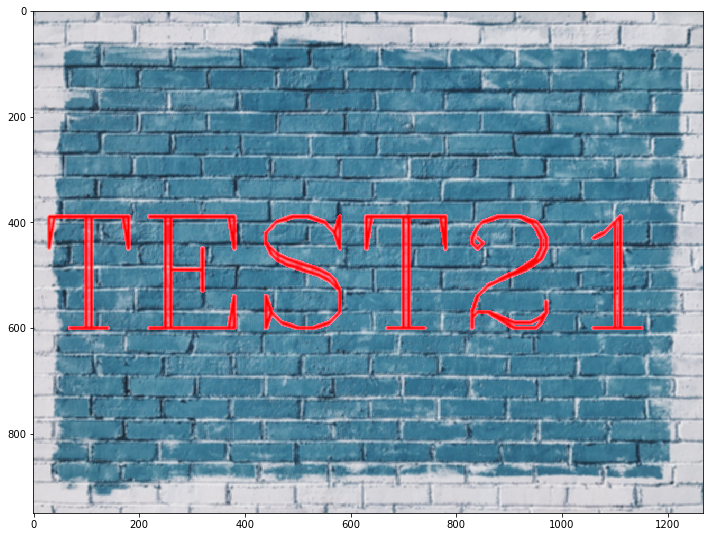

In [42]:
dst = cv2.filter2D(img, -1, kernel)
display_img(dst)

### Blur using cv2.blur

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


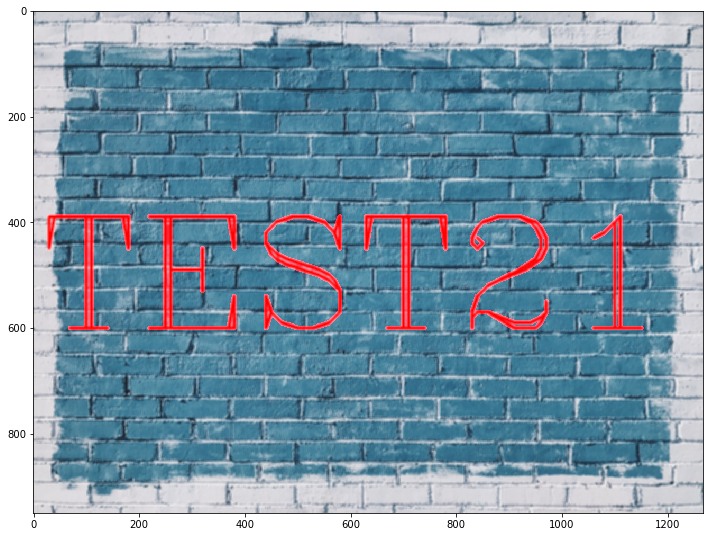

In [44]:
blurred =  cv2.blur(img, ksize=(5, 5))
display_img(blurred)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


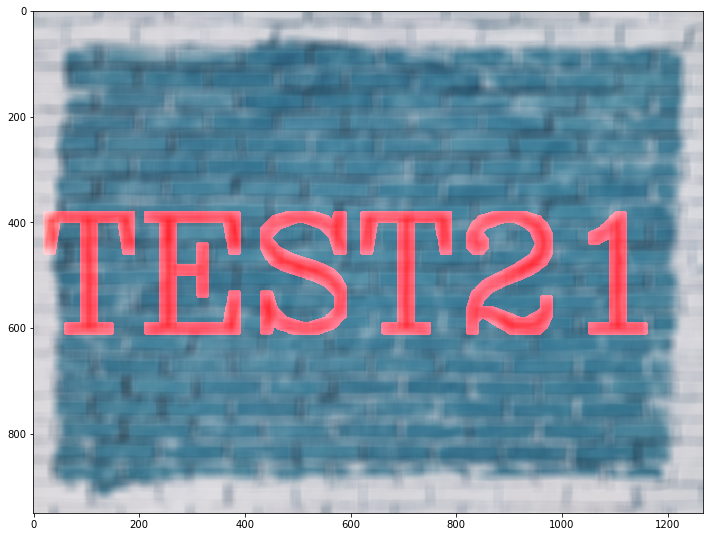

In [45]:
blurred =  cv2.blur(img, ksize=(20, 20))
display_img(blurred)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


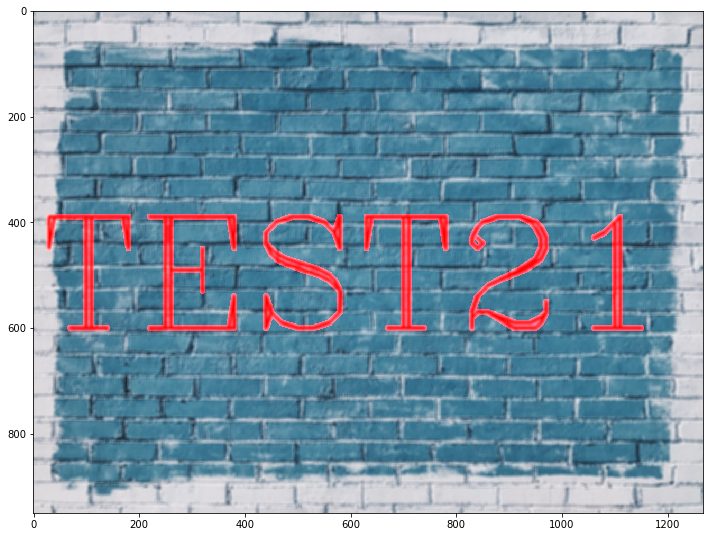

In [48]:
blurr3 = cv2.GaussianBlur(img, (7, 7), 10)
display_img(blurr3)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


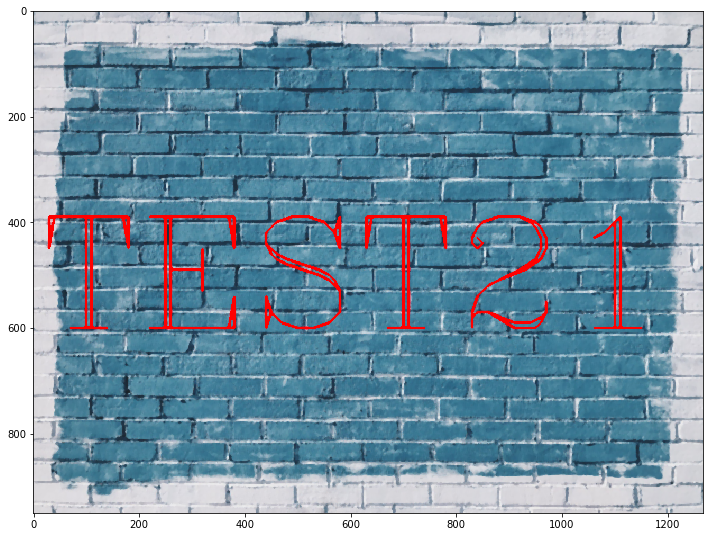

In [52]:
blurr4 = cv2.medianBlur(img, 5)
display_img(blurr4)

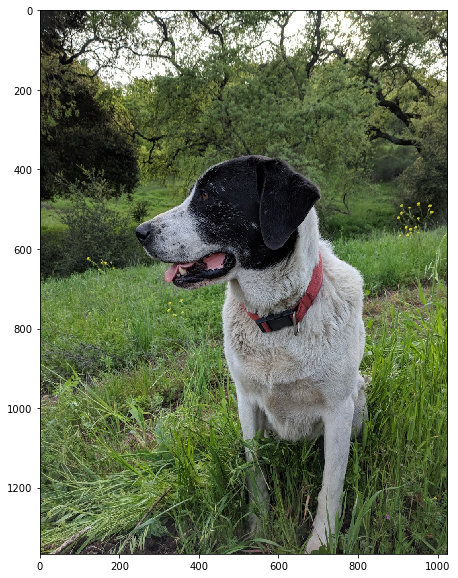

In [54]:
img = cv2.imread('../../opencv_udemy/DATA/sammy.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
display_img(img)

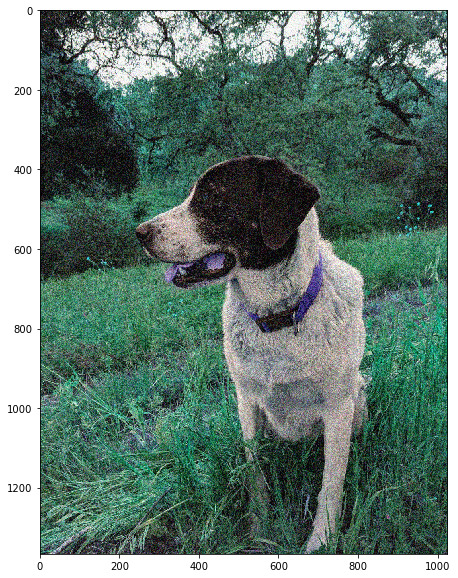

In [56]:
imgNoise = cv2.imread('../../opencv_udemy/DATA/sammy_noise.jpg')
imgNoise= cv2.cvtColor(imgNoise, cv2.COLOR_BGR2RGB)
display_img(imgNoise)

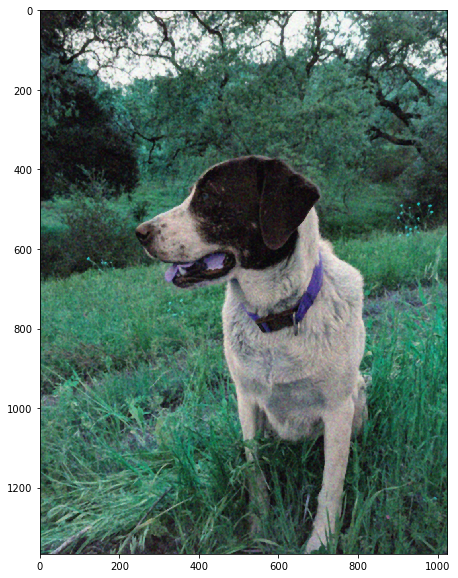

In [57]:
imgCorrected = cv2.medianBlur(imgNoise, 5)
display_img(imgCorrected)